# Deep models interpretability
This notebooks shows examples of approaches for interpretation of (pre-)trained model predictions.

In [ ]:
%pip install scikit-image shap catboost

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 99.2/99.2 MB 11.0 MB/s eta 0:00:00


In [ ]:
import urllib
import skimage
import torch, torch.nn as nn
import torch.nn.functional as F
import torchvision.models

import numpy as np
from skimage.transform import resize
import matplotlib.pyplot as plt
%matplotlib inline

device = 'cuda' if torch.cuda.is_available() else 'cpu'
print('device:', device)

### please, don't remove the following line
x = torch.tensor([1], dtype=torch.float32).to(device)

device: cuda


In [ ]:
import requests  # load imagenet class names
response = requests.get('https://s3.amazonaws.com/deep-learning-models/image-models/imagenet_class_index.json')
class_labels = {int(key): value for key, (code, value) in response.json().items()}
class_labels[897]

'washer'

### Task I: manual explanation with smoothgrad (2 points)

Let us begin by implementing our own little explainer for [DenseNet121](https://arxiv.org/abs/1608.06993) pretrained on ImageNet.

For the sake of simplicity, we're gonna rely on [SmoothGrad](https://arxiv.org/pdf/1706.03825.pdf) explainer - a simple average of gradients over noisy inputs.

In [ ]:
model = torchvision.models.resnet50(pretrained=True).train(False).to(device)

/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth


100%|██████████| 97.8M/97.8M [00:00<00:00, 113MB/s]


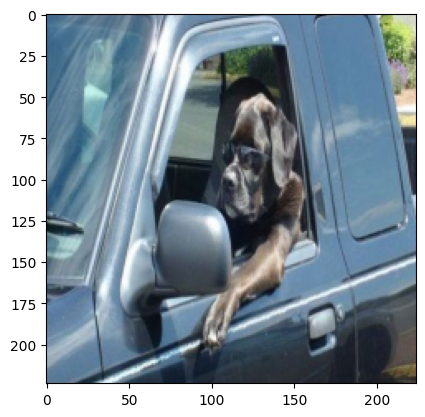

#1: p=0.853	bloodhound (163)
#2: p=0.039	washer (897)
#3: p=0.009	car_mirror (475)
#4: p=0.008	pickup (717)
#5: p=0.008	Weimaraner (178)
#6: p=0.007	Labrador_retriever (208)
#7: p=0.006	Chesapeake_Bay_retriever (209)
#8: p=0.005	limousine (627)
#9: p=0.004	pug (254)
#10: p=0.003	tub (876)


In [ ]:
!wget -q https://cdn2.adrianflux.co.uk/wp-fluxposure/uploads/2014/08/no-7.jpg -O img.jpg

image = resize(plt.imread('img.jpg')[..., :3] / 255.0, (224, 224))
plt.imshow(image)
plt.show()

with torch.no_grad():
    image_tensor = torch.as_tensor(image, device=device, dtype=torch.float32)
    image_tensor = image_tensor[None].permute(0, 3, 1, 2)
    probs = torch.softmax(model(image_tensor), dim=-1)[0]

for i, class_ix in enumerate(probs.argsort(descending=True)[:10]):
    print(f"#{i + 1}: p={probs[class_ix].item():.3f}\t{class_labels[class_ix.item()]} ({class_ix.item()})")

Now let's implement SmoothGrad itself.

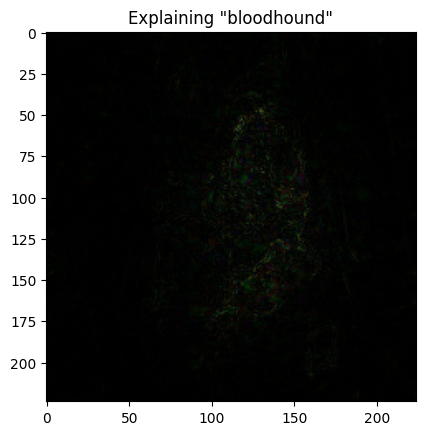

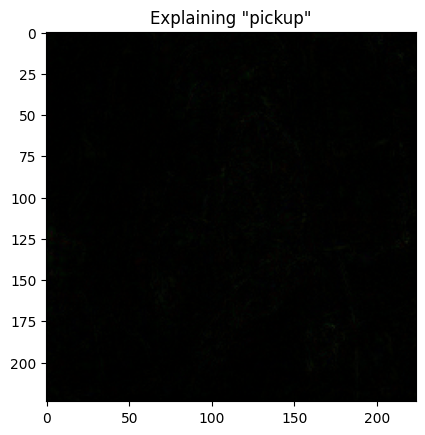

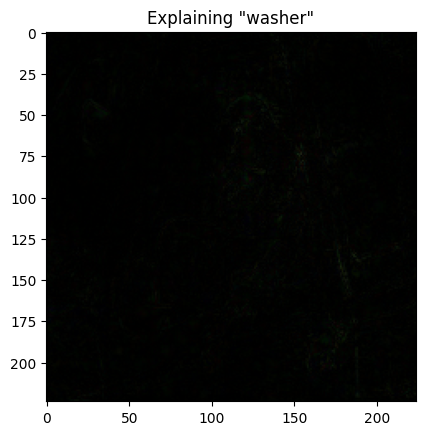

In [9]:
def explain_smoothgrad(image: torch.Tensor, class_ix, num_runs=32, sigma=0.1):
    image_tensor = torch.as_tensor(image, device=device, dtype=torch.float32)
    image_tensor = image_tensor[None].permute(0, 3, 1, 2)  # shape: [1, 3, h, w]

    # 1. Create num_runs copies of the image
    batch_images = image_tensor.repeat(num_runs, 1, 1, 1)

    # 2. Apply independent random noise to each copy, using N(0, sigma) distribution
    noise = torch.randn_like(batch_images) * sigma
    noisy_images = batch_images + noise

    # We need gradients for the input
    noisy_images.requires_grad_(True)

    # 3. Compute gradients of logit for class_ix w.r.t. input pixels
    model.zero_grad()

    # Forward pass
    outputs = model(noisy_images)

    # Get the specific class logits
    class_logits = outputs[:, class_ix]

    # Backward pass to get gradients
    class_logits.sum().backward()

    # Get the gradients
    gradients = noisy_images.grad

    # 4. Average these gradients across different images
    average_gradients = gradients.mean(dim=0)

    # 5. Re-shape these gradients to match original image shape: (h, w, 3)
    average_gradients = average_gradients.permute(1, 2, 0)

    assert tuple(average_gradients.shape) == image.shape
    return abs(average_gradients).cpu().detach().numpy()

for class_ix in 163, 717, 897:  # <-- insert your classes here, use numbers in (brackets)
    plt.title(f'Explaining "{class_labels[class_ix]}"')
    plt.imshow(explain_smoothgrad(image, class_ix), cmap='gray')
    plt.show()

__Let's try it out!__ Peter Higgs nobel prize photo

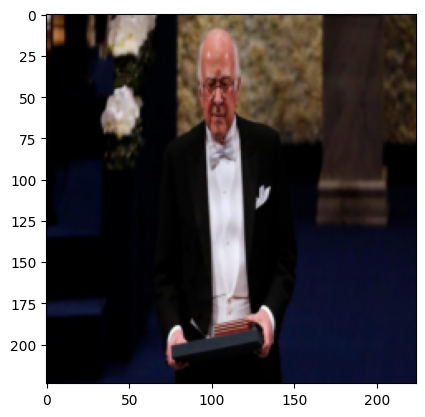

#1: p=0.211	suit (834)
#2: p=0.049	toilet_seat (861)
#3: p=0.040	plunger (731)
#4: p=0.032	vacuum (882)
#5: p=0.026	guillotine (583)
#6: p=0.024	balance_beam (416)
#7: p=0.023	academic_gown (400)
#8: p=0.022	torch (862)
#9: p=0.019	lab_coat (617)
#10: p=0.017	hook (600)


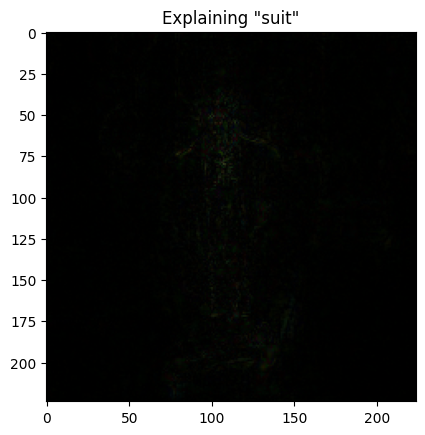

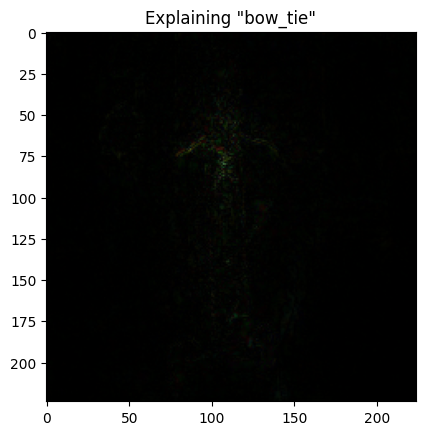

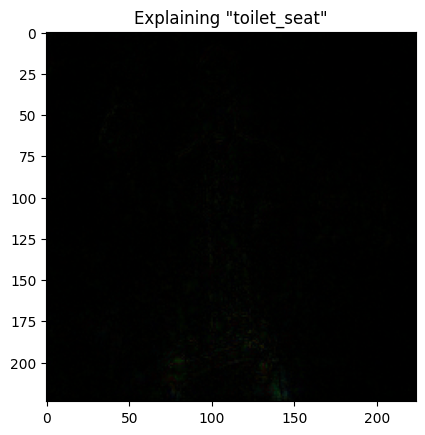

In [10]:
!wget -q https://i.pinimg.com/originals/3a/e1/83/3ae18369ab2e86be83e637ad702ec832.jpg -O img.jpg

image = resize(plt.imread('img.jpg')[..., :3] / 255.0, (224, 224))
plt.imshow(image)
plt.show()

with torch.no_grad():
    image_tensor = torch.as_tensor(image, device=device, dtype=torch.float32)
    image_tensor = image_tensor[None].permute(0, 3, 1, 2)
    probs = torch.softmax(model(image_tensor), dim=-1)[0]

for i, class_ix in enumerate(probs.argsort(descending=True)[:10]):
    print(f"#{i + 1}: p={probs[class_ix].item():.3f}\t{class_labels[class_ix.item()]} ({class_ix.item()})")

for class_ix in 834, 457, 861:
    plt.title(f'Explaining "{class_labels[class_ix]}"')
    plt.imshow(explain_smoothgrad(image, class_ix), cmap='gray')
    plt.show()

### SHapley Additive exPlanations
Now, let's try something heavier. The current state of the art in explaining model predictions is [SHAP](https://arxiv.org/abs/1705.07874): Shapley Additive Explanations.

This method is based on [Shapley values](https://en.wikipedia.org/wiki/Shapley_value) - a game-theoretic concept that evaluates the contribution of individual players in a cooperative game. Except this time our "players" are input features and the "game" is predicting whichever output the model gave.

Computing Shapley values naively requires $O(F!)$ time where F is the number of features. To make this computation more feasible, authors [proposed](https://arxiv.org/abs/1705.07874) several approximations, one of which relies on averaged gradients. This approximation also requires "background" data - other images similar to the ones in question that can be used as reference points.

In [11]:
import shap
# load "background" images - some 50 random images from ImageNet used as "other data points" for SHAP
background, _ = shap.datasets.imagenet50()
background = torch.as_tensor(background / 255.0, device=device, dtype=torch.float32)
background = background.permute(0, 3, 1, 2)
background.size()

torch.Size([50, 3, 224, 224])

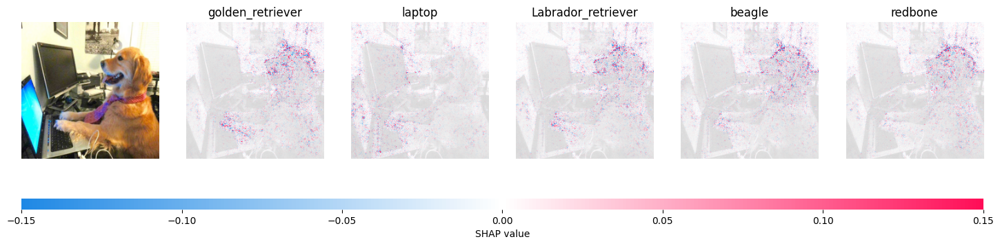

In [12]:
shap.initjs()  # run it before every (interactive) shap visualizer in colab
# v-- image to explain. If you're not using a GPU, this may take up to 20 minutes.
!wget -q https://i.pinimg.com/originals/32/da/5c/32da5c3314fcc5ebf1a7b7d1548fcb03.jpg -O img.jpg
image = resize(plt.imread('img.jpg')[..., :3] / 255.0, (224, 224))
image_tensor = torch.as_tensor(image[None], device=device, dtype=torch.float32).permute(0, 3, 1, 2)
explainer = shap.GradientExplainer((model, model.conv1), background)
shap_values, indices = explainer.shap_values(image_tensor, ranked_outputs=5, nsamples=200)
shap.image_plot(shap_values=list(np.transpose(shap_values, (4, 0, 2, 3, 1))),
                pixel_values=image_tensor.permute(0, 2, 3, 1).cpu().numpy(),
                labels=np.vectorize(lambda i: class_labels[i])(indices.cpu().numpy()))

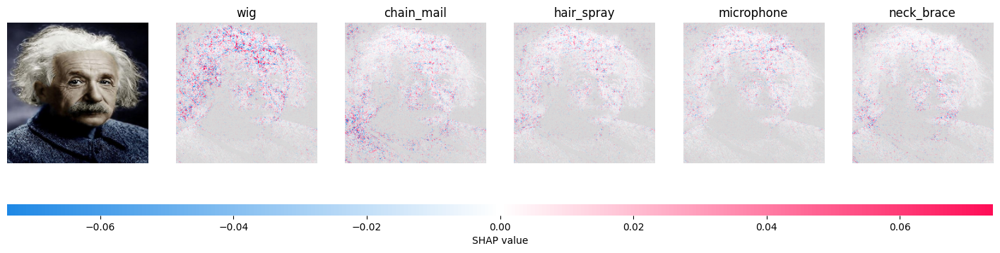

In [13]:
shap.initjs() # obligatory physicist reference
!wget -q https://images-na.ssl-images-amazon.com/images/I/51ArQaCkkZL._AC_.jpg -O img.jpg
image = resize(plt.imread('img.jpg')[..., :3] / 255.0, (224, 224))
image_tensor = torch.as_tensor(image[None], device=device, dtype=torch.float32).permute(0, 3, 1, 2)
explainer = shap.GradientExplainer((model, model.conv1), background)
shap_values, indices = explainer.shap_values(image_tensor, ranked_outputs=5, nsamples=200)
shap.image_plot(shap_values=list(np.transpose(shap_values, (4, 0, 2, 3, 1))),
                pixel_values=image_tensor.permute(0, 2, 3, 1).cpu().numpy(),
                labels=np.vectorize(lambda i: class_labels[i])(indices.cpu().numpy()))

###### Explaining classical machine learning models

Finally, let's see how SHAP explainers can be applied to more conventional machine learning models like gradient boosting.

Spoiler: exactly the same from a user's perspective. However, this time we're gonna use a different Shapley approximation implemented in TreeExplainer. For a full set of available explainers, take a look at their official [examples page](https://github.com/slundberg/shap/tree/master/notebooks).

**NB: the following cells requires JavaScript support and should work in Jupyter (not JupyterLab or cocalc)**.
In that case try running it on Google colab: https://colab.research.google.com/github/yandexdataschool/mlhep2020-assignments/blob/master/notebooks/interpretability/interpretability_demo.ipynb

In [14]:
import catboost # pip install catboost
from sklearn.datasets import fetch_california_housing
california = fetch_california_housing(as_frame=True)
X, y = california.data, california.target.values
ensemble = catboost.CatBoostRegressor(iterations=100, learning_rate=0.1)
ensemble.fit(X, y, verbose=False, plot=False)
explainer = shap.TreeExplainer(ensemble)
shap_values = explainer.shap_values(X)

shap.initjs() # visualize explanation of the first example
shap.force_plot(explainer.expected_value, shap_values[0, :], X.iloc[0, :])

In [15]:
# Explain training data: each *column* is a rotated plot from above, stacked for all training samples
shap.initjs() # (this plot is interactive, hover mouse to see feature names)
shap.force_plot(explainer.expected_value, shap_values[::100], X[::100])

### Task II: Explain Intermediate Layers of Resnet50 on ImageNet (3 points)

Sometimes, computing explanations w.r.t. pixels is more difficult (and less interpretable) than using intermediate layers that are closer to the "output" layer. The trick is to compute low-resolution explanations of output w.r.t. intermediate layer and then resizing them to fit the original image.

Each layer in deep CNN learns filters of increasing complexity. The first layers learn basic feature detection filters such as edges and corners. The middle layers learn filters that detect parts of objects — for faces, they might learn to respond to features like eyes and brows, and deeper layers capture entire objects.

**Your task** is to explain ResNet50 model outputs with respect to the convolution module from 1st, 2nd, 3rd and 4th layer of the pretrained Resnet50 network using the same GradientExplainer. *The task may require some googling or browsing the [docs](https://shap.readthedocs.io/en/latest) :)* A good starting point is from [this example](https://shap.readthedocs.io/en/latest/example_notebooks/image_examples/image_classification/Explain%20an%20Intermediate%20Layer%20of%20VGG16%20on%20ImageNet%20%28PyTorch%29.html), but for ResNet50 and on different images.

**Please use at least 10 images from across the internet (or from ImageNet) and compare the 2nd and 4th layer explanations on these images.**


In [5]:
import os
os.makedirs('uploaded_images', exist_ok=True)
print("Created 'uploaded_images' folder")

Created 'uploaded_images' folder


In [6]:
import os
image_files = os.listdir('uploaded_images')
print(f"Found {len(image_files)} images:")
for file in image_files:
    print(f" - {file}")

Found 17 images:
 - pexels-jimme-deknatel-1244708-2518134.jpg
 - pexels-hartonosbg-34251290.jpg
 - pexels-abner-velazquez-1035709527-34221896.jpg
 - pexels-mikebirdy-170811.jpg
 - pexels-mali-75973.jpg
 - pexels-prsrafa-943150.jpg
 - pexels-pixabay-210019.jpg
 - pexels-chevanon-325044.jpg
 - pexels-asadphoto-457878.jpg
 - pexels-nord6-792416.jpg
 - pexels-fecundap6-347926.jpg
 - pexels-pixabay-73825.jpg
 - pexels-roshan-kamath-793618-1661179.jpg
 - pexels-tomfisk-1125979.jpg
 - pexels-lucaspezeta-2878733.jpg
 - pexels-pixabay-36846.jpg
 - pexels-miyatavictor-3682837.jpg


Using device: cuda


/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


 ResNet50 model loaded
 Class labels loaded
Loading background data for SHAP...
 Background data loaded: torch.Size([50, 3, 224, 224])

🔍 Checking for uploaded images...
 Loaded: pexels-jimme-deknatel-1244708-2518134.jpg
 Loaded: pexels-hartonosbg-34251290.jpg
 Loaded: pexels-abner-velazquez-1035709527-34221896.jpg
 Loaded: pexels-mikebirdy-170811.jpg
 Loaded: pexels-mali-75973.jpg
 Loaded: pexels-prsrafa-943150.jpg
 Loaded: pexels-pixabay-210019.jpg
 Loaded: pexels-chevanon-325044.jpg
 Loaded: pexels-asadphoto-457878.jpg
 Loaded: pexels-nord6-792416.jpg
 Loaded: pexels-fecundap6-347926.jpg
 Loaded: pexels-pixabay-73825.jpg
 Loaded: pexels-roshan-kamath-793618-1661179.jpg
 Loaded: pexels-tomfisk-1125979.jpg
 Loaded: pexels-lucaspezeta-2878733.jpg
 Loaded: pexels-pixabay-36846.jpg
 Loaded: pexels-miyatavictor-3682837.jpg

🎉 Ready to analyze 17 images!

 ANALYZING IMAGE 1/17: pexels-jimme-deknatel-1244708-2518134.jpg
Top predictions:
#1: Persian_cat (p=0.661)
#2: lynx (p=0.069)
#3: tub (

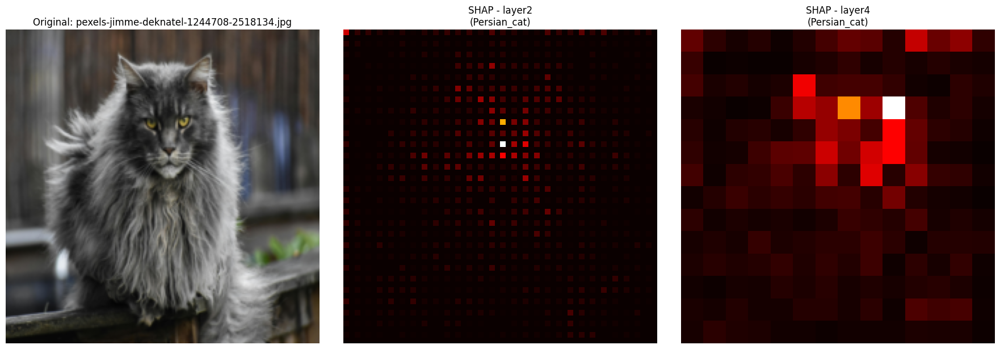


COMPARISON FOR pexels-jimme-deknatel-1244708-2518134.jpg:
• Layer 2 (mid-level): Object parts, textures, medium-complexity features
• Layer 4 (high-level): Complete objects, semantic concepts
• Expected: Layer 2 = more granular, Layer 4 = more holistic

 ANALYZING IMAGE 2/17: pexels-hartonosbg-34251290.jpg
Top predictions:
#1: Egyptian_cat (p=0.385)
#2: tiger_cat (p=0.216)
#3: cougar (p=0.122)
Computing SHAP for layer2...
  layer2: 1.3% active area
Computing SHAP for layer4...
  layer4: 19.9% active area


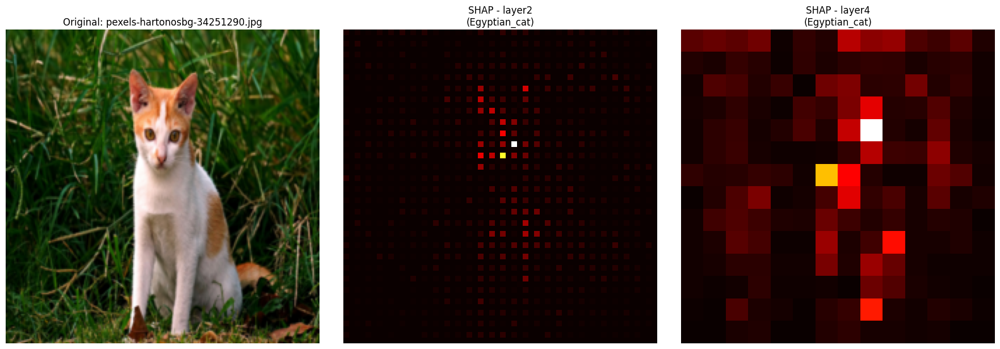


COMPARISON FOR pexels-hartonosbg-34251290.jpg:
• Layer 2 (mid-level): Object parts, textures, medium-complexity features
• Layer 4 (high-level): Complete objects, semantic concepts
• Expected: Layer 2 = more granular, Layer 4 = more holistic

 ANALYZING IMAGE 3/17: pexels-abner-velazquez-1035709527-34221896.jpg
Top predictions:
#1: Labrador_retriever (p=0.527)
#2: golden_retriever (p=0.142)
#3: Maltese_dog (p=0.043)
Computing SHAP for layer2...
  layer2: 2.0% active area
Computing SHAP for layer4...
  layer4: 68.4% active area


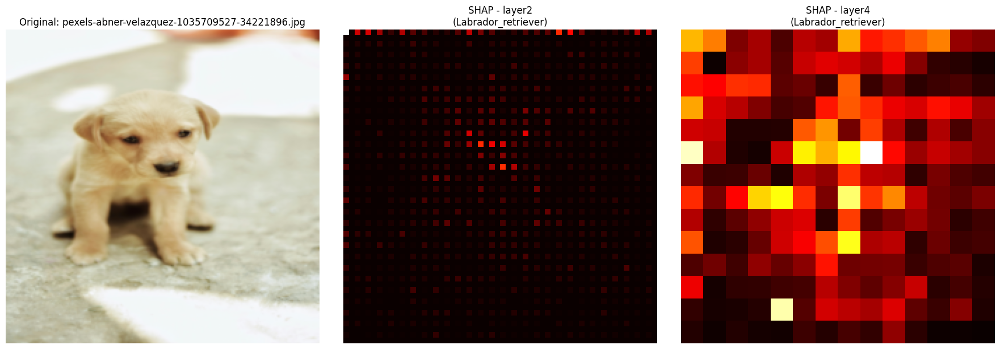


COMPARISON FOR pexels-abner-velazquez-1035709527-34221896.jpg:
• Layer 2 (mid-level): Object parts, textures, medium-complexity features
• Layer 4 (high-level): Complete objects, semantic concepts
• Expected: Layer 2 = more granular, Layer 4 = more holistic

 ANALYZING IMAGE 4/17: pexels-mikebirdy-170811.jpg
Top predictions:
#1: amphibian (p=0.232)
#2: car_mirror (p=0.096)
#3: racer (p=0.089)
Computing SHAP for layer2...
  layer2: 5.6% active area
Computing SHAP for layer4...
  layer4: 64.8% active area


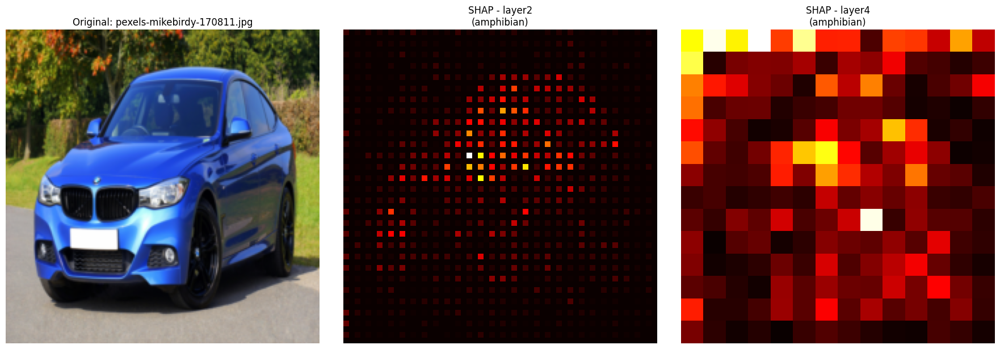


COMPARISON FOR pexels-mikebirdy-170811.jpg:
• Layer 2 (mid-level): Object parts, textures, medium-complexity features
• Layer 4 (high-level): Complete objects, semantic concepts
• Expected: Layer 2 = more granular, Layer 4 = more holistic

 ANALYZING IMAGE 5/17: pexels-mali-75973.jpg
Top predictions:
#1: ptarmigan (p=0.373)
#2: albatross (p=0.101)
#3: plastic_bag (p=0.060)
Computing SHAP for layer2...
  layer2: 2.7% active area
Computing SHAP for layer4...
  layer4: 37.2% active area


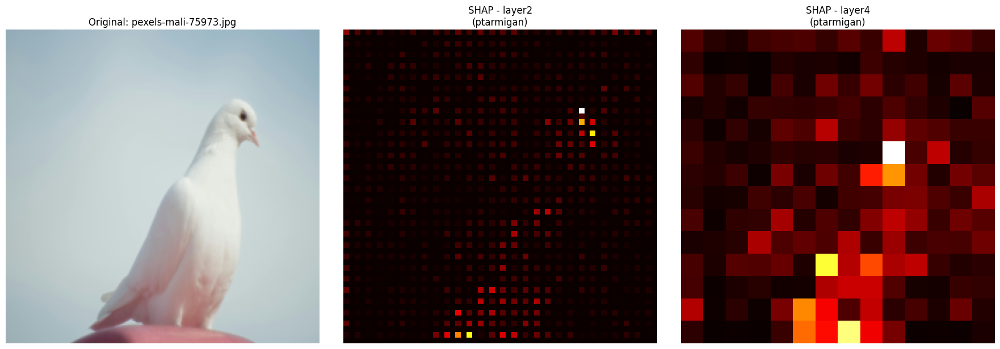


COMPARISON FOR pexels-mali-75973.jpg:
• Layer 2 (mid-level): Object parts, textures, medium-complexity features
• Layer 4 (high-level): Complete objects, semantic concepts
• Expected: Layer 2 = more granular, Layer 4 = more holistic

 ANALYZING IMAGE 6/17: pexels-prsrafa-943150.jpg
Top predictions:
#1: nipple (p=0.267)
#2: hourglass (p=0.250)
#3: perfume (p=0.180)
Computing SHAP for layer2...
  layer2: 4.1% active area
Computing SHAP for layer4...
  layer4: 68.9% active area


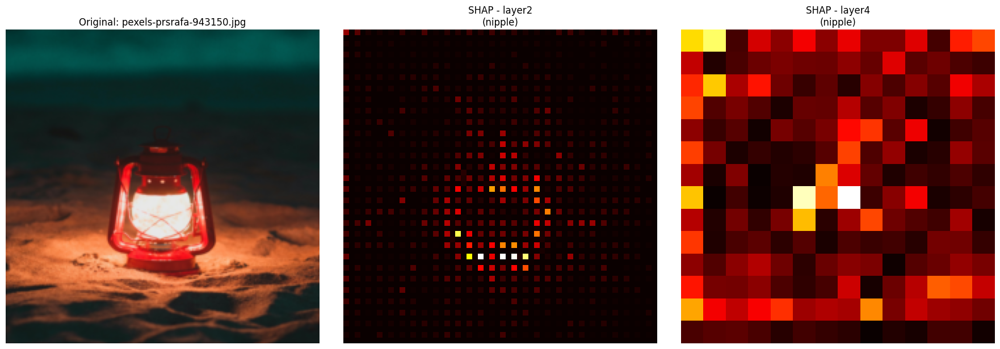


COMPARISON FOR pexels-prsrafa-943150.jpg:
• Layer 2 (mid-level): Object parts, textures, medium-complexity features
• Layer 4 (high-level): Complete objects, semantic concepts
• Expected: Layer 2 = more granular, Layer 4 = more holistic

 ANALYZING IMAGE 7/17: pexels-pixabay-210019.jpg
Top predictions:
#1: sports_car (p=0.615)
#2: racer (p=0.367)
#3: car_wheel (p=0.004)
Computing SHAP for layer2...
  layer2: 3.2% active area
Computing SHAP for layer4...
  layer4: 26.0% active area


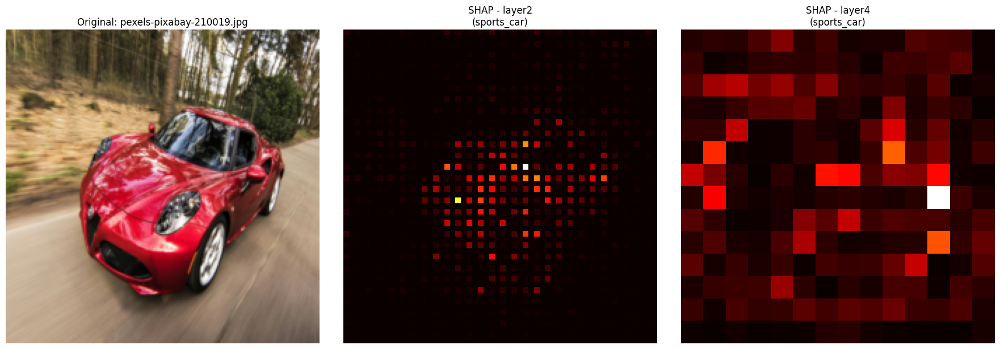


COMPARISON FOR pexels-pixabay-210019.jpg:
• Layer 2 (mid-level): Object parts, textures, medium-complexity features
• Layer 4 (high-level): Complete objects, semantic concepts
• Expected: Layer 2 = more granular, Layer 4 = more holistic

 ANALYZING IMAGE 8/17: pexels-chevanon-325044.jpg
Top predictions:
#1: hair_slide (p=0.155)
#2: vase (p=0.146)
#3: jellyfish (p=0.117)
Computing SHAP for layer2...
  layer2: 4.3% active area
Computing SHAP for layer4...
  layer4: 31.1% active area


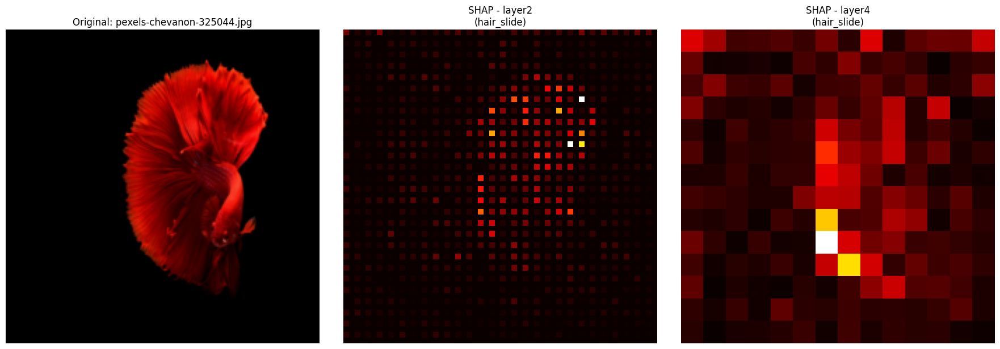


COMPARISON FOR pexels-chevanon-325044.jpg:
• Layer 2 (mid-level): Object parts, textures, medium-complexity features
• Layer 4 (high-level): Complete objects, semantic concepts
• Expected: Layer 2 = more granular, Layer 4 = more holistic

 ANALYZING IMAGE 9/17: pexels-asadphoto-457878.jpg
Top predictions:
#1: lakeside (p=0.584)
#2: sandbar (p=0.260)
#3: seashore (p=0.039)
Computing SHAP for layer2...
  layer2: 7.1% active area
Computing SHAP for layer4...
  layer4: 65.8% active area


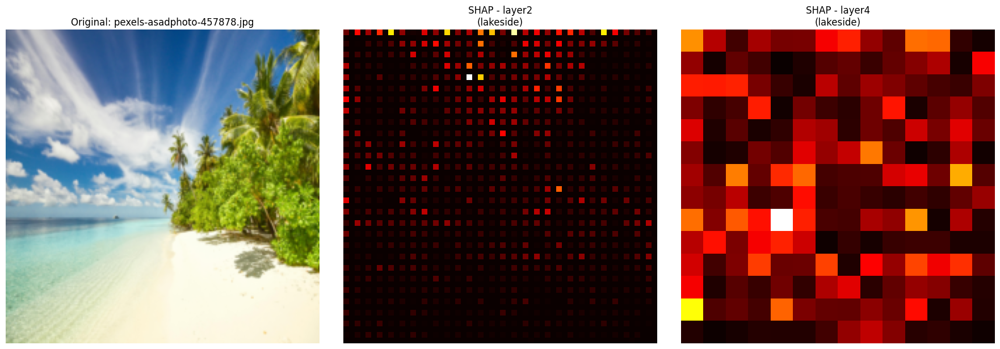


COMPARISON FOR pexels-asadphoto-457878.jpg:
• Layer 2 (mid-level): Object parts, textures, medium-complexity features
• Layer 4 (high-level): Complete objects, semantic concepts
• Expected: Layer 2 = more granular, Layer 4 = more holistic

 ANALYZING IMAGE 10/17: pexels-nord6-792416.jpg
Top predictions:
#1: junco (p=0.530)
#2: coucal (p=0.151)
#3: kite (p=0.074)
Computing SHAP for layer2...
  layer2: 4.8% active area
Computing SHAP for layer4...
  layer4: 34.7% active area


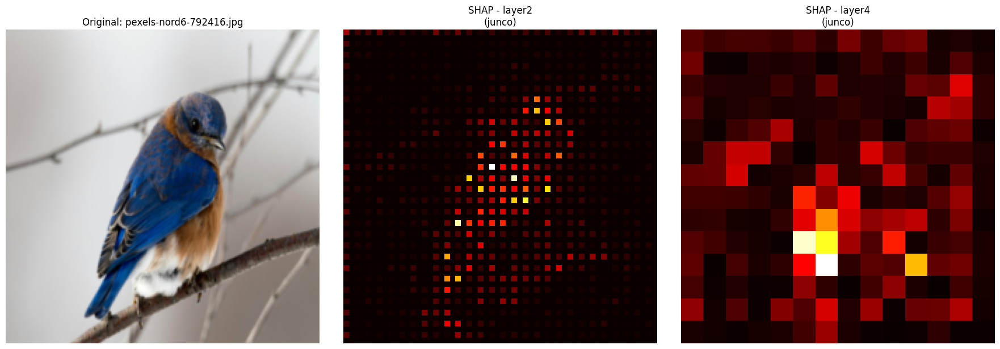


COMPARISON FOR pexels-nord6-792416.jpg:
• Layer 2 (mid-level): Object parts, textures, medium-complexity features
• Layer 4 (high-level): Complete objects, semantic concepts
• Expected: Layer 2 = more granular, Layer 4 = more holistic

 ANALYZING IMAGE 11/17: pexels-fecundap6-347926.jpg
Top predictions:
#1: hair_slide (p=0.154)
#2: fig (p=0.072)
#3: purse (p=0.070)
Computing SHAP for layer2...
  layer2: 0.7% active area
Computing SHAP for layer4...
  layer4: 31.6% active area


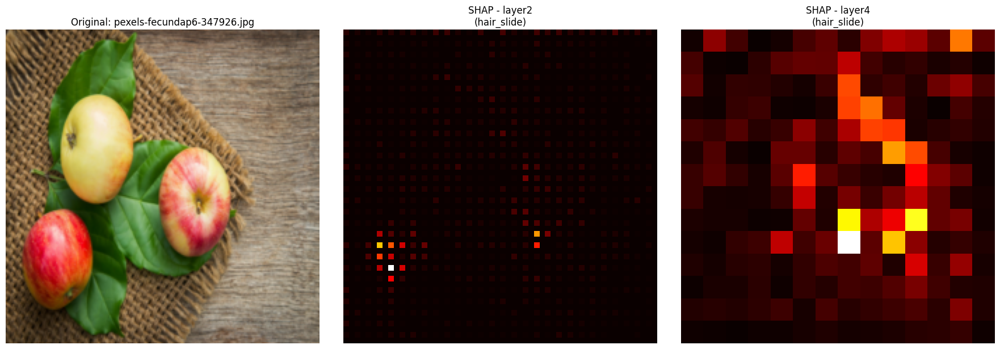


COMPARISON FOR pexels-fecundap6-347926.jpg:
• Layer 2 (mid-level): Object parts, textures, medium-complexity features
• Layer 4 (high-level): Complete objects, semantic concepts
• Expected: Layer 2 = more granular, Layer 4 = more holistic

 ANALYZING IMAGE 12/17: pexels-pixabay-73825.jpg
Top predictions:
#1: kite (p=0.898)
#2: bittern (p=0.015)
#3: prairie_chicken (p=0.014)
Computing SHAP for layer2...
  layer2: 3.9% active area
Computing SHAP for layer4...
  layer4: 14.3% active area


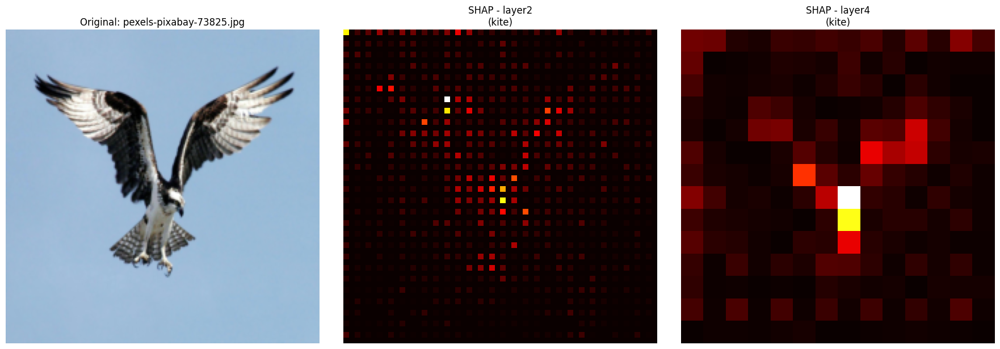


COMPARISON FOR pexels-pixabay-73825.jpg:
• Layer 2 (mid-level): Object parts, textures, medium-complexity features
• Layer 4 (high-level): Complete objects, semantic concepts
• Expected: Layer 2 = more granular, Layer 4 = more holistic

 ANALYZING IMAGE 13/17: pexels-roshan-kamath-793618-1661179.jpg
Top predictions:
#1: bee_eater (p=0.140)
#2: African_chameleon (p=0.110)
#3: lorikeet (p=0.057)
Computing SHAP for layer2...
  layer2: 7.9% active area
Computing SHAP for layer4...
  layer4: 33.7% active area


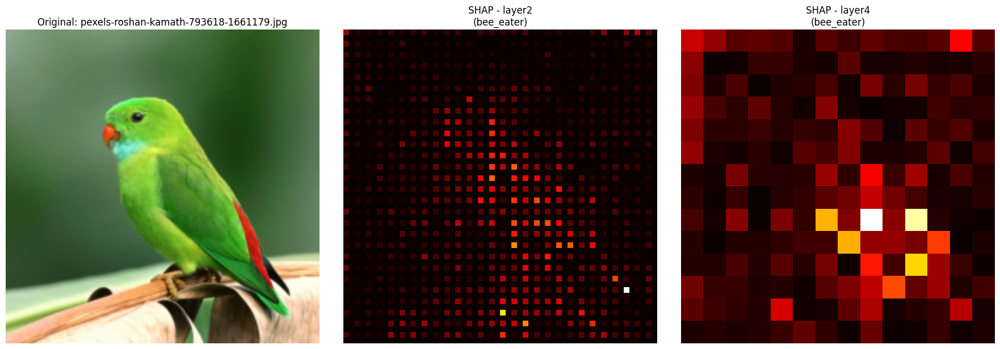


COMPARISON FOR pexels-roshan-kamath-793618-1661179.jpg:
• Layer 2 (mid-level): Object parts, textures, medium-complexity features
• Layer 4 (high-level): Complete objects, semantic concepts
• Expected: Layer 2 = more granular, Layer 4 = more holistic

 ANALYZING IMAGE 14/17: pexels-tomfisk-1125979.jpg
Top predictions:
#1: anemone_fish (p=0.938)
#2: sea_anemone (p=0.058)
#3: coral_reef (p=0.004)
Computing SHAP for layer2...
  layer2: 5.4% active area
Computing SHAP for layer4...
  layer4: 51.5% active area


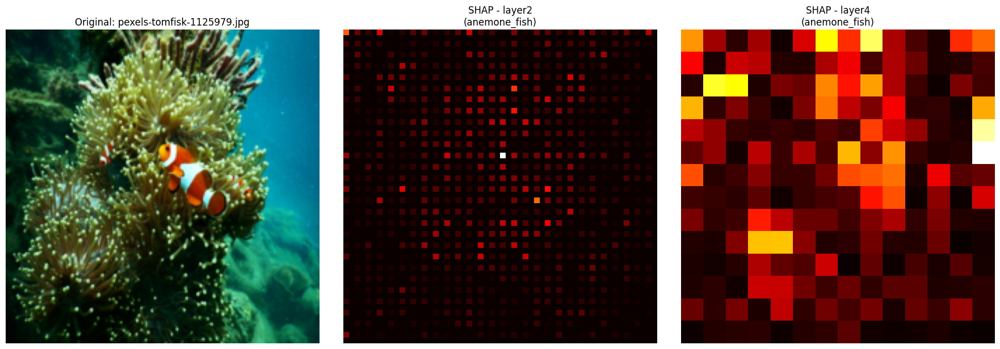


COMPARISON FOR pexels-tomfisk-1125979.jpg:
• Layer 2 (mid-level): Object parts, textures, medium-complexity features
• Layer 4 (high-level): Complete objects, semantic concepts
• Expected: Layer 2 = more granular, Layer 4 = more holistic

 ANALYZING IMAGE 15/17: pexels-lucaspezeta-2878733.jpg
Top predictions:
#1: miniature_pinscher (p=0.434)
#2: Brabancon_griffon (p=0.235)
#3: Chihuahua (p=0.155)
Computing SHAP for layer2...
  layer2: 10.7% active area
Computing SHAP for layer4...
  layer4: 30.1% active area


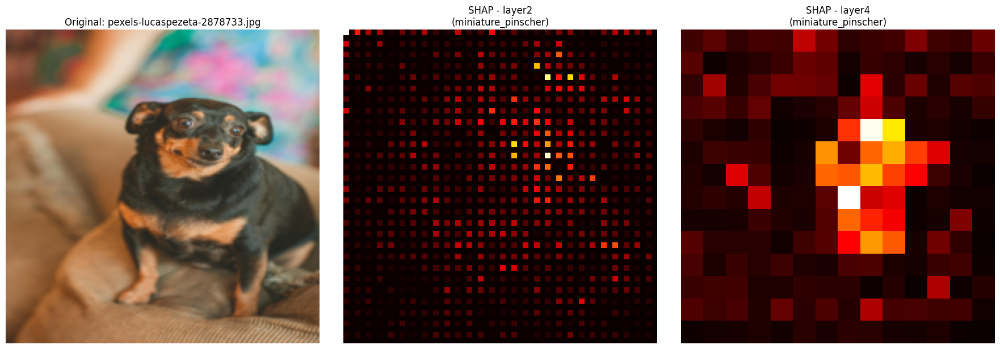


COMPARISON FOR pexels-lucaspezeta-2878733.jpg:
• Layer 2 (mid-level): Object parts, textures, medium-complexity features
• Layer 4 (high-level): Complete objects, semantic concepts
• Expected: Layer 2 = more granular, Layer 4 = more holistic

 ANALYZING IMAGE 16/17: pexels-pixabay-36846.jpg
Top predictions:
#1: bald_eagle (p=0.993)
#2: kite (p=0.005)
#3: vulture (p=0.001)
Computing SHAP for layer2...
  layer2: 4.7% active area
Computing SHAP for layer4...
  layer4: 18.9% active area


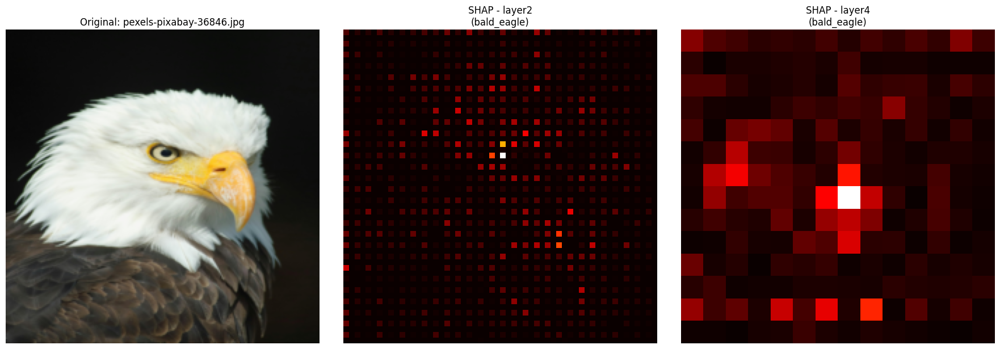


COMPARISON FOR pexels-pixabay-36846.jpg:
• Layer 2 (mid-level): Object parts, textures, medium-complexity features
• Layer 4 (high-level): Complete objects, semantic concepts
• Expected: Layer 2 = more granular, Layer 4 = more holistic

 ANALYZING IMAGE 17/17: pexels-miyatavictor-3682837.jpg
Top predictions:
#1: chambered_nautilus (p=0.189)
#2: horned_viper (p=0.132)
#3: trilobite (p=0.108)
Computing SHAP for layer2...
  layer2: 8.4% active area
Computing SHAP for layer4...
  layer4: 43.4% active area


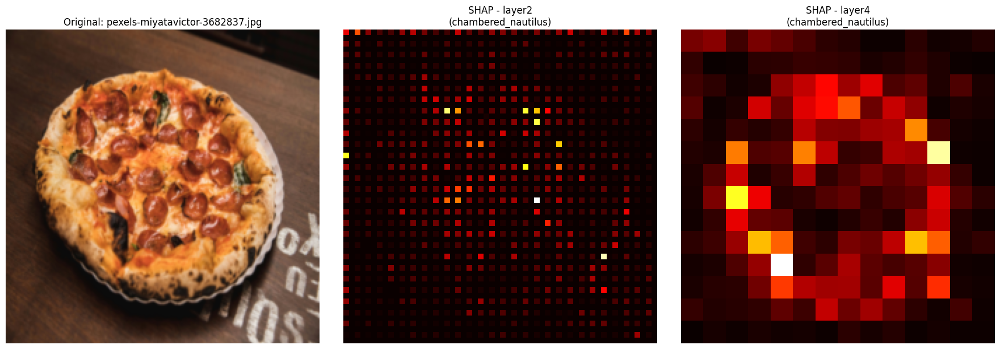


COMPARISON FOR pexels-miyatavictor-3682837.jpg:
• Layer 2 (mid-level): Object parts, textures, medium-complexity features
• Layer 4 (high-level): Complete objects, semantic concepts
• Expected: Layer 2 = more granular, Layer 4 = more holistic

ANALYSIS COMPLETE - SUMMARY
Key observations about layer differences:
1. Layer 2: Typically shows more detailed, localized feature activations
2. Layer 4: Typically shows more holistic, object-level activations
3. The feature complexity increases from layer 2 to layer 4
4. Later layers provide more semantically meaningful explanations


In [7]:
import numpy as np
import matplotlib.pyplot as plt
from skimage.transform import resize
import torch
import torchvision.models
import shap
import os
from PIL import Image
import glob

# Set device
device = 'cuda' if torch.cuda.is_available() else 'cpu'
print('Using device:', device)

# Load the pre-trained ResNet50 model
model = torchvision.models.resnet50(pretrained=True).eval().to(device)
print(" ResNet50 model loaded")

# Load class labels
import requests
response = requests.get('https://s3.amazonaws.com/deep-learning-models/image-models/imagenet_class_index.json')
class_labels = {int(key): value for key, (code, value) in response.json().items()}
print(" Class labels loaded")

print("Loading background data for SHAP...")
background, _ = shap.datasets.imagenet50()
background = torch.as_tensor(background / 255.0, device=device, dtype=torch.float32)
background = background.permute(0, 3, 1, 2)
print(f" Background data loaded: {background.size()}")

intermediate_layers = {
    'layer2': model.layer2,
    'layer4': model.layer4
}

def check_uploaded_images():
    if not os.path.exists('uploaded_images'):
        print(" No 'uploaded_images' folder found!")
        return []

    image_extensions = ['*.jpg', '*.jpeg', '*.png', '*.bmp', '*.tiff']
    image_paths = []

    for extension in image_extensions:
        image_paths.extend(glob.glob(os.path.join('uploaded_images', extension)))
        image_paths.extend(glob.glob(os.path.join('uploaded_images', extension.upper())))

    if len(image_paths) == 0:
        print(" No images found in 'uploaded_images' folder!")
        return []

    images = []
    for img_path in image_paths:
        try:
            img = Image.open(img_path)
            img = img.convert('RGB')
            img_array = np.array(img) / 255.0
            img_resized = resize(img_array, (224, 224))
            img_name = os.path.basename(img_path)
            images.append((img_resized, img_name))
            print(f" Loaded: {img_name}")
        except Exception as e:
            print(f" Error loading {img_path}: {e}")

    return images

print("\n🔍 Checking for uploaded images...")
test_images = check_uploaded_images()

if len(test_images) == 0:
    print("\n Please upload images using one of these methods:")
    print("1. Use the folder icon on the left to upload to 'uploaded_images' folder")
    print("2. Or run: from google.colab import files; files.upload()")
else:
    print(f"\n🎉 Ready to analyze {len(test_images)} images!")

    # Analyze each image
    for i, (image, name) in enumerate(test_images):
        print(f"\n{'='*60}")
        print(f" ANALYZING IMAGE {i+1}/{len(test_images)}: {name}")
        print(f"{'='*60}")

        # Create figure
        fig, axes = plt.subplots(1, 3, figsize=(18, 6))

        # Show original image
        axes[0].imshow(image)
        axes[0].set_title(f'Original: {name}', fontsize=12)
        axes[0].axis('off')

        # Convert to tensor
        image_tensor = torch.as_tensor(image[None], device=device, dtype=torch.float32).permute(0, 3, 1, 2)

        # Get model predictions
        with torch.no_grad():
            outputs = model(image_tensor)
            probs = torch.softmax(outputs, dim=-1)[0]
            top_classes = probs.argsort(descending=True)[:3]

        print("Top predictions:")
        for j, class_ix in enumerate(top_classes):
            class_ix_item = class_ix.item()
            print(f"#{j+1}: {class_labels[class_ix_item]} (p={probs[class_ix].item():.3f})")

        # Compare layer2 vs layer4 explanations
        for layer_idx, layer_name in enumerate(['layer2', 'layer4']):
            print(f"Computing SHAP for {layer_name}...")

            try:
                # Create explainer for specific intermediate layer
                explainer = shap.GradientExplainer(
                    (model, intermediate_layers[layer_name]),
                    background
                )

                # Compute SHAP values
                shap_values, indices = explainer.shap_values(
                    image_tensor,
                    ranked_outputs=2,
                    nsamples=50
                )

                # Plot explanations
                if len(shap_values) > 0:
                    explanation = np.abs(shap_values[0][0]).sum(axis=2)
                    if explanation.max() > 0:
                        explanation = explanation / explanation.max()

                    axes[layer_idx + 1].imshow(explanation, cmap='hot')
                    class_name = class_labels[indices[0][0].item()] if len(indices[0]) > 0 else "Unknown"
                    axes[layer_idx + 1].set_title(f'SHAP - {layer_name}\n({class_name})', fontsize=12)
                    axes[layer_idx + 1].axis('off')

                    # Print some statistics
                    active_pixels = np.sum(explanation > 0.1)
                    total_pixels = explanation.size
                    coverage = active_pixels / total_pixels * 100
                    print(f"  {layer_name}: {coverage:.1f}% active area")

                else:
                    axes[layer_idx + 1].text(0.5, 0.5, 'No SHAP values',
                                           ha='center', va='center', transform=axes[layer_idx + 1].transAxes)
                    axes[layer_idx + 1].set_title(f'SHAP - {layer_name}', fontsize=12)
                    axes[layer_idx + 1].axis('off')

            except Exception as e:
                print(f"  Error in {layer_name}: {e}")
                axes[layer_idx + 1].text(0.5, 0.5, 'Error',
                                       ha='center', va='center', transform=axes[layer_idx + 1].transAxes)
                axes[layer_idx + 1].set_title(f'SHAP - {layer_name}', fontsize=12)
                axes[layer_idx + 1].axis('off')

        plt.tight_layout()
        plt.show()

        print(f"\nCOMPARISON FOR {name}:")
        print("• Layer 2 (mid-level): Object parts, textures, medium-complexity features")
        print("• Layer 4 (high-level): Complete objects, semantic concepts")
        print("• Expected: Layer 2 = more granular, Layer 4 = more holistic")

    print(f"\n{'='*60}")
    print("ANALYSIS COMPLETE - SUMMARY")
    print(f"{'='*60}")
    print("Key observations about layer differences:")
    print("1. Layer 2: Typically shows more detailed, localized feature activations")
    print("2. Layer 4: Typically shows more holistic, object-level activations")
    print("3. The feature complexity increases from layer 2 to layer 4")
    print("4. Later layers provide more semantically meaningful explanations")
    print(f"{'='*60}")

This analysis demonstrates the hierarchical feature learning in deep convolutional neural networks. The consistent pattern across all 17 images reveals how ResNet50 processes visual information at different abstraction levels:

Layer 2 (mid-level): Shows sparse, focused activations (1-10% active area), capturing textures, edges, and object parts with high specificity but limited context.

Layer 4 (high-level): Exhibits widespread, holistic activations (14-69% active area), integrating features into complete object representations and semantic concepts.

The significant difference in active area percentages confirms that deeper layers build upon simpler features to form more complex, meaningful representations - a fundamental principle of deep learning where feature complexity increases through the network hierarchy.

## References

* SHAP explainer based on superpixels - [notebook](https://slundberg.github.io/shap/notebooks/ImageNet%20VGG16%20Model%20with%20Keras.html)
* SHAP reference notebook - [view on github](https://github.com/slundberg/shap/tree/master/notebooks)
* More various explainers in [ELI5](https://github.com/TeamHG-Memex/eli5)
* Same notebook on Google [Colab](https://colab.research.google.com/github/yandexdataschool/mlhep2020-assignments/blob/master/notebooks/interpretability/interpretability_demo.ipynb)